In [16]:
using QuantumOptics, LinearAlgebra, WignerSymbols, Plots
import SparseArrays.spdiagm

In [2]:
RationalOrInt = (Union{T,R} where T<:Integer where R<:Rational)

struct Multiplet <: Basis
    shape::Vector{Int}
    r::RationalOrInt          # Total angular momentum
    q::Dict                   # Dictionary of other quantum numbers
    mu::Real                  # Magnetic moment
    name::String              # Name of multiplet
    Multiplet(r,q,mu,name) = new(Int[2r+1],r,q,mu,name)
end

In [3]:
# TODO: Make an AbstractAtom<:Basis abstract struct and make Atom and AtomBasis subtypes.  Then make Atom have shape and multiplets. 

struct AtomBasis <: Basis
    shape::Vector{Int}
    multiplets::Vector{Multiplet}
    AtomBasis(multiplets::Vector{Multiplet}) = new(sum(m.shape for m in multiplets),multiplets)
end

struct Atom
    basis::AtomBasis
    energies::Vector       # Energies of each multiplet in absense of external fields
    gammas::Matrix         # Lifetimes γ between pairs of multiplets.  <s'||d||s>^2 = γ_{s',s} * (3 \epsilon_0 \hbar \lambda^3)/8pi^2
    units::String
end

Atom(ms::Vector{Multiplet},es::Vector,gs::Matrix,us::String) = Atom(AtomBasis(ms),es,gs,us)

function SubAtom(a::Atom,indices::Vector)
    all( i -> (i isa Integer) && 1<=i<=length(a.basis.multiplets) , indices) || error("Invalid indices.")
    basis = AtomBasis([a.basis.multiplets[i] for i in indices])
    energies = [a.energies[i] for i in indices]
    gammas = [a.gammas[i,j] for i in indices, j in indices]
    return Atom(basis, energies, gammas, a.units)
end

function AtomStateIndex(a::AtomBasis,multipletIdx::Int,mstate::RationalOrInt)
    return convert(Int, sum( (m.shape[1] for m in a.multiplets[1:multipletIdx-1]) ,init = 0) + mstate + a.multiplets[multipletIdx].r + 1)
end

AtomStateIndex(a::AtomBasis,name::String,mstate::RationalOrInt) = AtomStateIndex(a, findfirst(m->m.name==name,a.multiplets), mstate)
AtomStateIndex(a::Atom,multipletIdx::Int,mstate::RationalOrInt) = AtomStateIndex(a.basis,multipletIdx,mstate)
AtomStateIndex(a::Atom,name::String,mstate::RationalOrInt) = AtomStateIndex(a.basis,name,mstate)

function AtomMultipletIndices(a::AtomBasis,multipletIdx::Int)
    mp = a.multiplets[multipletIdx]
    return AtomStateIndex(a,multipletIdx,-mp.r):AtomStateIndex(a,multipletIdx,mp.r)
end

AtomMultipletIndices(a::AtomBasis,name::String) = AtomMultipletIndices(a, findfirst(m->m.name==name,a.multiplets))
AtomMultipletIndices(a::Atom,multipletIdx::Int) = AtomMultipletIndices(a.basis,multipletIdx)
AtomMultipletIndices(a::Atom,name::String) = AtomMultipletIndices(a.basis, findfirst(m->m.name==name,a.basis.multiplets))

function AtomIndexMultiplet(a::AtomBasis,i::Integer)
    # Returns (multiplet_index, m_index, m) where the first is the index of the multiplet in a.multiplets,
    # the second is the index of the m state in the corresponding multiplet, and the third is the m state eigenvalue. 
    i <= a.shape[1] && i > 0 || error("Index $(i) out of AtomBasis index range $(1:a.shape[1]).")
    idxs = cumsum(m.shape[1] for m in a.multiplets)
    plet = findfirst(i .<= idxs)
    m = a.multiplets[plet].r - (idxs[plet] - i)
    mIdx = m + 1 + a.multiplets[plet].r
    return plet, mIdx, m
end

AtomIndexMultiplet(a::Atom,i::Integer) = AtomIndexMultiplet(a.basis,i)

AtomIndexMultiplet (generic function with 2 methods)

In [287]:
AtomIndexMultiplet(Sr88.basis,4)

(2, 3, 1)

In [39]:
[AtomMultipletIndices(Sr88,j) for j=1:6]

6-element Vector{UnitRange{Int64}}:
 1:1
 2:4
 5:5
 6:8
 9:13
 14:16

In [4]:
# Here we start to introduce units.  I'll use MHz for energies, Gauss for magnetic fields, and I don't know yet for electric fields. 
# Magnetic level structure functions and constants.
gs = −2.00231930436256                                           # Electron g-factor
Lande(S,L,J) = ( ( J*(J+1) - S*(S+1) + L*(L+1) ) + gs*( J*(J+1) + S*(S+1) - L*(L+1) ) )/(2*J*(J+1))
muB = 1.400                                                      # Units of h MHz/Gauss
muMoment(S,L,J) = iszero(J) ? 0.0 : -muB * Lande(S,L,J) * J      # Magnetic moment (LS coupling?)

LNames = ["S","P","D","F","G","H","I","K","L","M","N"]
function LSString(S::RationalOrInt,L::Int,J::RationalOrInt)
    L+1 <= length(LNames) ? string(Integer(2S+1))*"'"*string(LNames[L+1])*"'"*string(J) : string(Integer(2S+1))*"'"*string(L)*"'"*string(J)
end

function Multiplet(S::RationalOrInt,L::Int,J::RationalOrInt)
    Multiplet(J,Dict(:S=>S,:L=>L),muMoment(S,L,J),LSString(S,L,J))
end

Multiplet

In [18]:
sr88_1S0 = Multiplet(0,0,0)
sr88_1P1 = Multiplet(0,1,1)
sr88_3P0 = Multiplet(1,1,0)
sr88_3P1 = Multiplet(1,1,1)
sr88_3P2 = Multiplet(1,1,2)
sr88_3S1 = Multiplet(1,0,1)

sr88_energies = [0,650.503499,429.22800422987365,434.829121311,446.647242704,(434.829121311+435.731497)] * 1e6    # In MHz
sr88_gammas = [0 2.01e8 0 4.69e4 0 0 ; 0 0 0 0 0 0 ; 0 0 0 0 0 8.9e6 ; 0 0 0 0 0 2.7e7 ; 0 0 0 0 0 4.2e7 ; 0 0 0 0 0 0] .* (1e-6)#/2pi)
Sr88 = Atom([sr88_1S0,sr88_1P1,sr88_3P0,sr88_3P1,sr88_3P2,sr88_3S1],sr88_energies,sr88_gammas,"MHz")

Atom(AtomBasis([16], Multiplet[Multiplet([1], 0, Dict(:L => 0, :S => 0), 0.0, "1'S'0"), Multiplet([3], 1, Dict(:L => 1, :S => 0), -1.4, "1'P'1"), Multiplet([1], 0, Dict(:L => 1, :S => 1), 0.0, "3'P'0"), Multiplet([3], 1, Dict(:L => 1, :S => 1), 0.701623513053792, "3'P'1"), Multiplet([5], 2, Dict(:L => 1, :S => 1), 1.403247026107584, "3'P'2"), Multiplet([3], 1, Dict(:L => 0, :S => 1), 2.803247026107584, "3'S'1")]), [0.0, 6.50503499e8, 4.2922800422987366e8, 4.34829121311e8, 4.46647242704e8, 8.70560618311e8], [0.0 201.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 42.0; 0.0 0.0 … 0.0 0.0], "MHz")

In [6]:
function Zeeman(a::AtomBasis,B::Number)
    spdiagm( [(B * a.multiplets[AtomIndexMultiplet(a,i)[1]].mu * AtomIndexMultiplet(a,i)[3] for i=1:a.shape[1])...] )
end
Zeeman(a::Atom,B::Number) = Zeeman(a.basis,B)

Zeeman (generic function with 2 methods)

In [505]:
Zeeman(Sr88.basis,1) |> diag

16-element SparseVector{Float64, Int64} with 16 stored entries:
  [1 ]  =  0.0
  [2 ]  =  1.4
  [3 ]  =  -0.0
  [4 ]  =  -1.4
  [5 ]  =  0.0
  [6 ]  =  -0.701624
  [7 ]  =  0.0
  [8 ]  =  0.701624
  [9 ]  =  -2.80649
  [10]  =  -1.40325
  [11]  =  0.0
  [12]  =  1.40325
  [13]  =  2.80649
  [14]  =  -2.80325
  [15]  =  0.0
  [16]  =  2.80325

In [7]:
function mLevelGamma(gamma::Number,j₁::Multiplet,m₁::RationalOrInt,j₂::Multiplet,m₂::RationalOrInt,q::Int)
    # j₁, m₁ are lower level parameters, j₂, m₂ upper level parameters, and q is the light polarization.
    return gamma * clebschgordan(j₁, m₁, 1, q, j₂, m₂)^2
end

struct Laser
    a::Atom
    nearLevels::Vector{Tuple{Int,Int}}
    amplitude::Number
    polarization::Tuple{Number,Number,Number}
    frequency::Number
end

struct Coupling
    a::Atom
    lower::Int
    upper::Int
    reducedRabi::Number
    polarization::Tuple{Number,Number,Number}
    detuning::Number
end

# Example: c = Coupling(Sr88,4,6,1,(1,0,0),1)

In [8]:
# Vector operator helper functions

function VecOpSparseData(l::Multiplet,u::Multiplet,q::Int)
    # For spherical component q of a vector operator and a lower and upper multiplet, 
    # this function returns the indices of the lower and upper multiplet which are coupled
    # and the corresponding Clebsch-Gordan coefficients.  These are returned as three iterables,
    # I, J, C, with I[i] coupled to J[i] with coefficient C[i].
    idxl = (max(-l.r,-u.r-q):min(l.r,u.r-q)) .+ (1+l.r)
    idxu = (max(-u.r,-l.r+q):min(u.r,l.r+q)) .+ (1+u.r)
    coef = [clebschgordan(l.r,m,1,q,u.r) for m in (-l.r:l.r)[idxl]]
    return idxl, idxu, coef
end
# Example: I, J, C = VecOpSparseData(Sr88.basis.multiplets[1],Sr88.basis.multiplets[2],1)

function AtomVectorOperator(a::AtomBasis,lower::Int,upper::Int,q::Int)
    # Constructs a symmetric sparse matrix of level Clebsch-Gordan couplings. 
    # q = -1, 0, 1 indexes a spherical vector component of a vector operator. 
    I, J, C = VecOpSparseData(a.multiplets[lower],a.multiplets[upper],q)
    return sparse([AtomMultipletIndices(a,lower)[I]... , AtomMultipletIndices(a,upper)[J]...], [AtomMultipletIndices(a,upper)[J]... , AtomMultipletIndices(a,lower)[I]...], [C... , C...],a.shape[1],a.shape[1])
end

AtomVectorOperator(a::Atom,lower::Int,upper::Int,q::Int) = AtomVectorOperator(a.basis,lower,upper,q)

# Example: AtomVectorOperator(Sr88.basis,1,4,0)

AtomVectorOperator (generic function with 2 methods)

In [9]:
# Graph and tree functions

function adjacencyMatrix(edges::Vector{Tuple{Int,Int}})
    m = max((e[i] for e in edges, i in (1,2))...)
    A = zeros(Int,m,m)
    for e in edges
        A[e[1],e[2]] += 1
        A[e[2],e[1]] += 1
    end
    return A
end

function graphLaplacian(edges::Vector{Tuple{Int,Int}})
    A = adjacencyMatrix(edges)
    degrees = [sum(A,dims=1)...]
    return diagm(degrees) - A
end

function isForest(edges::Vector{Tuple{Int,Int}})
    L = graphLaplacian(edges)
    return tr(L) == rank(L)*2
end

function ditreeRank(es::Vector{Tuple{I,I,R}},n::Integer;returnClusters=false) where {I<:Integer, R<:Real}
    clusters = [Set(i) for i=1:n]
    clusterIdx = [1:n...]
    ranks = zeros(n)
    for e in es
        ci1 = clusterIdx[e[1]]
        ci2 = clusterIdx[e[2]]
        r1 = ranks[e[1]]
        r2 = ranks[e[2]]
        for i in clusters[ci2]
            ranks[i] += e[3]+r1-r2
            clusterIdx[i] = ci1
        end
        clusters[ci1] = union(clusters[ci1],clusters[ci2])
        clusters[ci2] = Set()
    end
    if returnClusters
        return ranks, clusters
    else
        return ranks
    end
end

function ditreeRank(es::Vector{Tuple{I,I,R}};returnClusters=false) where {I<:Integer, R<:Real}
    n = max((e[1] for e in es)...,(e[2] for e in es)...)
    ditreeRank1(es,n;returnClusters)
end

ditreeRank (generic function with 2 methods)

In [490]:
t1 = [(1,2,7.4),(1,3,3),(3,4,2),(5,6,2),(5,7,2)]
t2 = [(1,2,4.3),(1,3,-4),(4,3,7),(4,5,12),(6,1,8)]
ditreeRank1(t1,returnClusters=true)

([0.0, 7.4, 3.0, 5.0, 0.0, 2.0, 2.0], Set{Int64}[Set([4, 2, 3, 1]), Set(), Set(), Set(), Set([5, 6, 7]), Set(), Set()])

In [10]:
# Time independent interaction Hamiltonians and Lindbladians.
# TR in the names stands for time reducible

function TRCouplingMatrix(c::Coupling,diags=1)
    if any(p==1 for p in c.polarization) && sum(c.polarization)==1
        q = findfirst(p==1 for p in c.polarization) - 2
        HInt = c.reducedRabi * AtomVectorOperator(c.a,c.lower,c.upper,q)
        HDetuning = sparse(AtomMultipletIndices(c.a,c.upper),AtomMultipletIndices(c.a,c.upper),c.detuning,c.a.basis.shape[1],c.a.basis.shape[1])
        return HInt + HDetuning * diags
    else
        Hm = c.reducedRabi * AtomVectorOperator(c.a,c.lower,c.upper,-1) * c.polarization[1]
        H0 = c.reducedRabi * AtomVectorOperator(c.a,c.lower,c.upper,0) * c.polarization[2]
        Hp = c.reducedRabi * AtomVectorOperator(c.a,c.lower,c.upper,1) * c.polarization[3]
        HDetuning = sparse(AtomMultipletIndices(c.a,c.upper),AtomMultipletIndices(c.a,c.upper),c.detuning,c.a.basis.shape[1],c.a.basis.shape[1])
        return Hm + H0 + Hp + HDetuning * diags
    end
end

function multipletDiagonal(a::AtomBasis,ds::Vector)
    length(ds) == length(a.multiplets) || error("Diagonal vector and multiplet vector must have same length.")
    return spdiagm(vcat((fill(ds[i],a.multiplets[i].shape[1]) for i in 1:length(ds))...))
end
multipletDiagonal(a::Atom,ds::Vector) = multipletDiagonal(a.basis,ds)

function TRTree(vc::Vector{Coupling})
    edges = [(c.lower,c.upper) for c in vc]
    isForest(edges) || error("Coupling topology has loops.  Cannot eliminate time dependence.")
    all(c.a == vc[1].a for c in vc) ? ab = vc[1].a.basis : error("All couplings must be for the same atom.")
    offDiag = sum(TRCouplingMatrix(c,0) for c in vc)
    
    diedges = [(c.lower,c.upper,c.detuning) for c in vc]
    HDetuning = multipletDiagonal(ab,ditreeRank(diedges,length(ab.multiplets)))
    return offDiag + HDetuning
end

TRTree (generic function with 1 method)

In [85]:
function Lindblads(a::Atom; combine::Bool=false)
    Js = []
    γs = []
    for i=1:size(a.gammas,1), j=1:size(a.gammas,1)
        if ~iszero(a.gammas[i,j])
            lower = a.basis.multiplets[i]
            upper = a.basis.multiplets[j]
            for m=-lower.r:lower.r
                for q=-1:1
                    if (m+q) in -upper.r:upper.r
                        cg = clebschgordan(lower.r, m, 1, q, upper.r)
                        if ~iszero(cg)
                            idxl = AtomStateIndex(a,i,m)
                            idxu = AtomStateIndex(a,j,m+q)
                            J = sparse([idxl],[idxu],[cg],a.basis.shape[1],a.basis.shape[1])
                            push!(Js,J)
                            push!(γs,a.gammas[i,j])
                        end
                    end
                end
            end
        end
    end
    return Js, γs
end

Lindblads (generic function with 1 method)

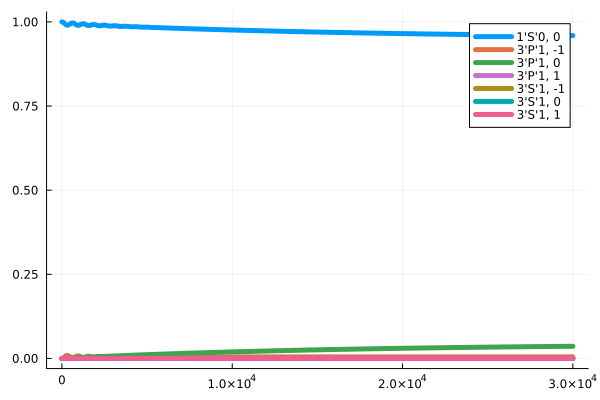

In [495]:
A = SubAtom(Sr88,[1,4,6])
b = NLevelBasis(A.basis.shape[1])

jumpMatrices, γs = Lindblads(A)
jumps = [SparseOperator(b,b,convert.(Float64,j)) for j in jumpMatrices] .* γs .*1;

C689 = Coupling(A,1,2,0.0005,(1,0,0),-0.01)
C688 = Coupling(A,2,3,0.1,(0,1,0),0.01)
M = convert.(Float64,TRTree([C689,C688]))
HTR = SparseOperator(b,b,M)
ρ0 = DenseOperator(b,b,sparse([1],[1],[1.0 + 0.0im],b.shape[1],b.shape[1]))
tout, pops = timeevolution.master([0:1:30000;], ρ0, HTR, jumps);

p = plot()
for i in [1, AtomMultipletIndices(A,2)..., AtomMultipletIndices(A,3)...]
    plet,mIdx,m = AtomIndexMultiplet(A,i)
    plot!(p,tout, [real(p.data[i,i]) for p in pops], label = A.basis.multiplets[plet].name*", $(m)", linewidth=5, thickness_scaling = 1)
end
p

Any[0.0469, 0.0469, 0.0469, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0]

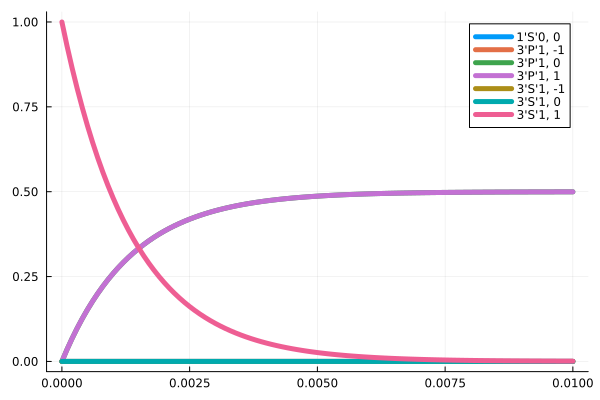

In [84]:
A = SubAtom(Sr88,[1,4,6])
b = NLevelBasis(A.basis.shape[1])

jumpMatrices, γs = Lindblads(A)
jumps = [SparseOperator(b,b,convert.(Float64,j)) for j in jumpMatrices] .* γs .*1;
print(γs)

C689 = Coupling(A,1,2,0.0005,(1,0,0),-0.01)
C688 = Coupling(A,2,3,0.1,(0,1,0),0.01)
M = convert.(Float64,0*TRTree([C689,C688]))
HTR = SparseOperator(b,b,M)
ρ0 = DenseOperator(b,b,sparse([7],[7],[1.0 + 0.0im],b.shape[1],b.shape[1]))
tout, pops = timeevolution.master([0:0.0001:0.01;], ρ0, HTR, jumps);

p = plot()
for i in [1, AtomMultipletIndices(A,2)..., AtomMultipletIndices(A,3)...]
    plet,mIdx,m = AtomIndexMultiplet(A,i)
    plot!(p,tout, [real(p.data[i,i]) for p in pops], label = A.basis.multiplets[plet].name*", $(m)", linewidth=5, thickness_scaling = 1)
end
p

In [81]:
jumps = [SparseOperator(b,b,convert.(Float64,j)) for j in jumpMatrices] .* γs .*1

9-element Vector{Operator{NLevelBasis{Int64}, NLevelBasis{Int64}, SparseArrays.SparseMatrixCSC{Float64, Int64}}}:
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([1], [2], [0.0469], 7, 7)
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([1], [3], [0.0469], 7, 7)
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([1], [4], [0.0469], 7, 7)
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([2], [5], [-19.091883092036785], 7, 7)
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([2], [6], [-19.091883092036785], 7, 7)
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([3], [5], [19.091883092036785], 7, 7)
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([3], [7], [-19.091883092036785], 7, 7)
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([4], [6], [19.091883092036785], 7, 7)
 Operator(dim=7x7)
  basis: NLevel(N=7)sparse([4], [7], [19.091883092036785], 7, 7)

In [78]:
jumpMatrices

9-element Vector{Any}:
 sparse([1], [2], RationalRoots.RationalRoot{BigInt}[+√(1//1)], 7, 7)
 sparse([1], [3], RationalRoots.RationalRoot{BigInt}[+√(1//1)], 7, 7)
 sparse([1], [4], RationalRoots.RationalRoot{BigInt}[+√(1//1)], 7, 7)
 sparse([2], [5], RationalRoots.RationalRoot{BigInt}[-√(1//2)], 7, 7)
 sparse([2], [6], RationalRoots.RationalRoot{BigInt}[-√(1//2)], 7, 7)
 sparse([3], [5], RationalRoots.RationalRoot{BigInt}[+√(1//2)], 7, 7)
 sparse([3], [7], RationalRoots.RationalRoot{BigInt}[-√(1//2)], 7, 7)
 sparse([4], [6], RationalRoots.RationalRoot{BigInt}[+√(1//2)], 7, 7)
 sparse([4], [7], RationalRoots.RationalRoot{BigInt}[+√(1//2)], 7, 7)

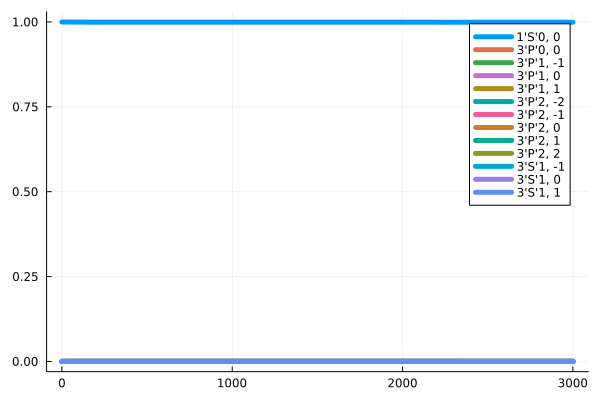

In [103]:
# Excluding 1P1.
A = SubAtom(Sr88,[1,3,4,5,6])
b = NLevelBasis(A.basis.shape[1])

jumpMatrices, γs = Lindblads(A)
jumps = [SparseOperator(b,b,convert.(Float64,j)) for j in jumpMatrices] .* sqrt.(γs) .*1;

C689 = Coupling(A,1,3,0.0005,(0,1,0),0.0)
C688 = Coupling(A,3,5,0.1,(1,0,0),0.00)
C679 = Coupling(A,2,5,0.1*0,(0,1,0),0.00)
M = convert.(Float64,TRTree([C689,C688,C679])) + Zeeman(A,1)
HTR = SparseOperator(b,b,M)
ρ0 = DenseOperator(b,b,sparse([1],[1],[1.0 + 0.0im],b.shape[1],b.shape[1]))
tout, pops = timeevolution.master([0:1:3000;], ρ0, HTR, jumps);

p = plot()
for i in [1, AtomMultipletIndices(A,2)..., AtomMultipletIndices(A,3)...,AtomMultipletIndices(A,4)...,AtomMultipletIndices(A,5)...]
    plet,mIdx,m = AtomIndexMultiplet(A,i)
    plot!(p,tout, [real(p.data[i,i]) for p in pops], label = A.basis.multiplets[plet].name*", $(m)", linewidth=5, thickness_scaling = 1)
end
p

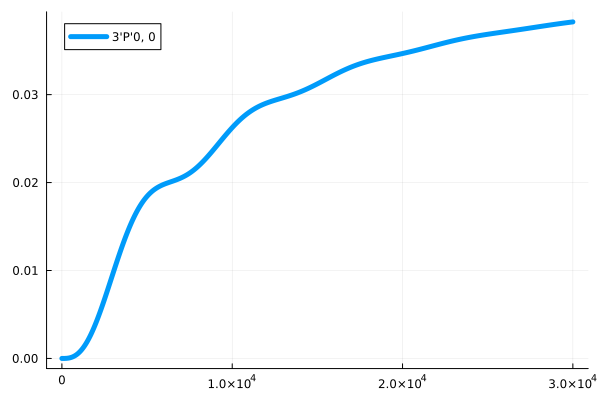

In [527]:
p = plot()
for i in [AtomMultipletIndices(A,2)...]#, AtomMultipletIndices(A,3)...,AtomMultipletIndices(A,4)...,AtomMultipletIndices(A,5)...]
    plet,mIdx,m = AtomIndexMultiplet(A,i)
    plot!(p,tout, [real(p.data[i,i]) for p in pops], label = A.basis.multiplets[plet].name*", $(m)", linewidth=5, thickness_scaling = 1)
end
p

In [39]:
Isats = [0.00298,1.72,0.591]                               # 689, 688, 679 in mW/cm^2
sats = [0.834,7.23,2.51]/(pi*0.038^2 / 2)./Isats
rabis = sqrt.(0.5 * sats) .* [Sr88.gammas[1,4],Sr88.gammas[4,6],Sr88.gammas[3,6]]
rabis2 = [8,570,270]
detunings = [28,-2565,-2536]
detunings2 = [28,-2565,-2537]

3-element Vector{Int64}:
    28
 -2565
 -2537

In [26]:
rabis

3-element Vector{Float64}:
   1.853998313173826
 130.8067899487176
  43.34058066937222

In [30]:
clebschgordan(1,1,1,-1,1,0)

+√(1//2)

3-element Vector{Int64}:
   8
 570
 270

In [572]:
rabis2 ./ rabis

3-element Vector{Float64}:
 4.314998532175008
 4.357571959555515
 6.22972733244441

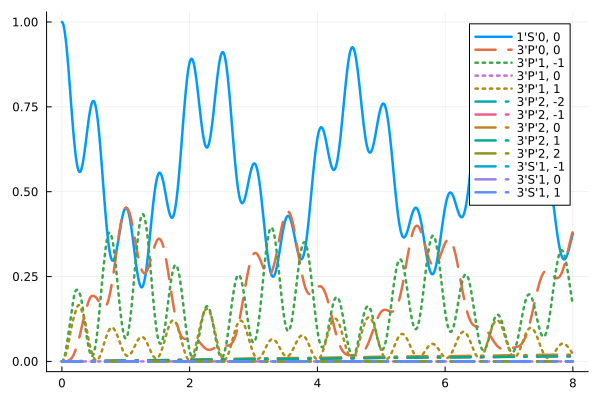

In [107]:
# 3 photon transition.  Excluding 1P1.
A = SubAtom(Sr88,[1,3,4,5,6])
b = NLevelBasis(A.basis.shape[1])

jumpMatrices, γs = Lindblads(A)
jumps = [SparseOperator(b,b,convert.(Float64,j)) for j in jumpMatrices] .* sqrt.(γs) .*1;

r, d = rabis/3, detunings/3
C689 = Coupling(A,1,3,r[1],(1/sqrt(2),0,1/sqrt(2)),d[1])
C688 = Coupling(A,3,5,r[2],(1/sqrt(2),0,1/sqrt(2)),d[2])
C679 = Coupling(A,2,5,r[3],(0,1,0),d[3])
M = convert.(Float64,TRTree([C689,C688,C679])) + Zeeman(A,10)# M -= UniformScaling(M[1,1])
HTR = SparseOperator(b,b,M)
ρ0 = DenseOperator(b,b,sparse([1],[1],[1.0 + 0.0im],b.shape[1],b.shape[1]))
tout, pops = timeevolution.master([0:0.01:8;], ρ0, HTR, jumps);

p = plot()
for plet = 1:5
    for i in AtomMultipletIndices(A,plet)
        plet,mIdx,m = AtomIndexMultiplet(A,i)
        plot!(p,tout, [real(p.data[i,i]) for p in pops], label = A.basis.multiplets[plet].name*", $(m)", linewidth=2.5, thickness_scaling = 1, linestyle=[:solid, :dash, :dot, :dashdot, :dashdotdot][plet])
    end
end
p

In [108]:
[[clebschgordan(j,m,1,0,j) for m=-j:j] for j=1:3]

3-element Vector{Vector{RationalRoots.RationalRoot{BigInt}}}:
 [-√(1//2), +√(0//1), +√(1//2)]
 [-√(2//3), -√(1//6), +√(0//1), +√(1//6), +√(2//3)]
 [-√(3//4), -√(1//3), -√(1//12), +√(0//1), +√(1//12), +√(1//3), +√(3//4)]

In [ ]:
function pletPlot(a::AbstractAtom,tout::Vector,pops::Vector{Operator{T,T, Matrix{ComplexF64}}}) where T<:Basis
    p = plot()
    for plet=1:length(a.multiplets)
        for i in atomMultipletIndices(A,plet)
            tmp,mIdx,m = atomIndexMultiplet(A,i)
            plot!(p,tout,[real(pop.data[i,i]) for pop in pops], label = A.multiplets[plet].name * ", m=$(m)", linewidth=2.5, thickness_scaling=1, linestyle=[:solid, :dash, :dot, :dashdot, :dashdotdot][(plet % 5)+1])
        end
    end
    p
end

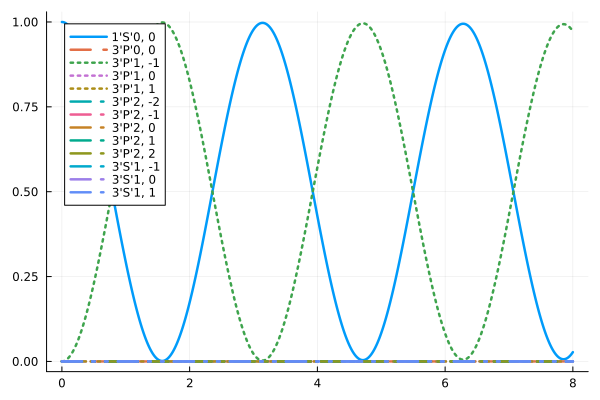

In [114]:
# 3 photon transition.  Excluding 1P1.
A = SubAtom(Sr88,[1,3,4,5,6])
b = NLevelBasis(A.basis.shape[1])

jumpMatrices, γs = Lindblads(A)
jumps = [SparseOperator(b,b,convert.(Float64,j)) for j in jumpMatrices] .* γs .*1;

#r, d = rabis2, detunings/2
C689 = Coupling(A,1,3,1,(1,0,0/sqrt(2)),0)
#C688 = Coupling(A,3,5,r[2],(1/sqrt(2),0,1/sqrt(2)),d[2])
#C679 = Coupling(A,2,5,r[3],(0,1,0),d[3])
M = convert.(Float64,TRTree([C689])) #+ Zeeman(A,10)# M -= UniformScaling(M[1,1])
HTR = SparseOperator(b,b,M)
ρ0 = DenseOperator(b,b,sparse([1],[1],[1.0 + 0.0im],b.shape[1],b.shape[1]))
tout, pops = timeevolution.master([0:0.01:8;], ρ0, HTR, jumps);

p = plot()
for plet = 1:5
    for i in AtomMultipletIndices(A,plet)
        plet,mIdx,m = AtomIndexMultiplet(A,i)
        plot!(p,tout, [real(p.data[i,i]) for p in pops], label = A.basis.multiplets[plet].name*", $(m)", linewidth=2.5, thickness_scaling = 1, linestyle=[:solid, :dash, :dot, :dashdot, :dashdotdot][plet])
    end
end
p

In [539]:
C689 = Coupling(A,1,3,rabis[1],(1/sqrt(2),0,1/sqrt(2)),28)
C688 = Coupling(A,3,5,rabis[2],(1/sqrt(2),0,1/sqrt(2)),-2565)
C679 = Coupling(A,2,5,rabis[3],(0,1,0),-2536)
M = convert.(Float64,TRTree([C689,C688,C679])) + Zeeman(A,10)
M |> diag 

13-element SparseVector{Float64, Int64} with 11 stored entries:
  [1 ]  =  1.0
  [3 ]  =  21.9838
  [4 ]  =  29.0
  [5 ]  =  36.0162
  [6 ]  =  -28.0649
  [7 ]  =  -14.0325
  [9 ]  =  14.0325
  [10]  =  28.0649
  [11]  =  -2564.03
  [12]  =  -2536.0
  [13]  =  -2507.97

In [542]:
TRTree([C689,C688,C679]) - UniformScaling(1) 

13×13 SparseMatrixCSC{Float64, Int64} with 26 stored entries:
  ⋅         ⋅        1.31097     ⋅      …       ⋅           ⋅           ⋅ 
  ⋅       -1.0        ⋅          ⋅              ⋅         43.3406       ⋅ 
 1.31097    ⋅       28.0         ⋅              ⋅        -65.4034       ⋅ 
  ⋅         ⋅         ⋅        28.0           65.4034       ⋅        -65.4034
 1.31097    ⋅         ⋅          ⋅              ⋅         65.4034       ⋅ 
  ⋅         ⋅         ⋅          ⋅      …       ⋅           ⋅           ⋅ 
  ⋅         ⋅         ⋅          ⋅              ⋅           ⋅           ⋅ 
  ⋅         ⋅         ⋅          ⋅              ⋅           ⋅           ⋅ 
  ⋅         ⋅         ⋅          ⋅              ⋅           ⋅           ⋅ 
  ⋅         ⋅         ⋅          ⋅              ⋅           ⋅           ⋅ 
  ⋅         ⋅         ⋅        65.4034  …  -2537.0          ⋅           ⋅ 
  ⋅       43.3406  -65.4034      ⋅              ⋅      -2537.0          ⋅ 
  ⋅         ⋅         ⋅       -65.4

In [510]:
x = [0 0 0 0 ; 3 0 0 0 ; 0 4.5 0 0 ; 0 0 2 0 ]
M = (exp.(x) .* (t-> (iszero(t) ? 0.0 : 1.0)).(x))
U = UniformScaling(1)
#log.(inv(UniformScaling(4) - M))
#log.((exp.(x) .* x)^3)
log.( inv(U-M) )

4×4 Matrix{Float64}:
 0.0  -Inf   -Inf   -Inf
 3.0    0.0  -Inf   -Inf
 7.5    4.5    0.0  -Inf
 9.5    6.5    2.0    0.0

In [237]:
jumpMatrices, γs = Lindblads(Sr88)
jumps = [SparseOperator(Sr88.basis,Sr88.basis,convert.(Float64,j)) for j in jumpMatrices] .* γs;

In [240]:
typeof(HTR)

Operator{NLevelBasis{Int64}, NLevelBasis{Int64}, SparseMatrixCSC{Float64, Int64}}

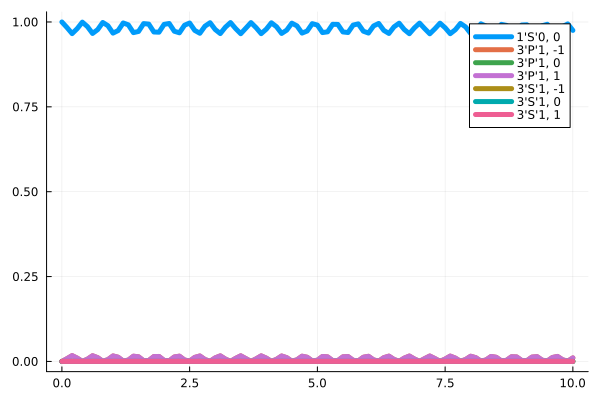

In [322]:
A = Sr88
b = NLevelBasis(A.basis.shape[1])

jumpMatrices, γs = Lindblads(A)
jumps = [SparseOperator(b,b,convert.(Float64,j)) for j in jumpMatrices] .* γs;

C689 = Coupling(A,1,4,1,(1,0,1),15)
C688 = Coupling(A,4,6,1,(0,1,0),0)
M = convert.(Float64,TRTree([C689,C688]))
HTR = SparseOperator(b,b,M)
ρ0 = DenseOperator(b,b,sparse([1],[1],[1.0 + 0.0im],b.shape[1],b.shape[1]))
tout, pops = timeevolution.master([0:0.1:10;], ρ0, HTR, jumps);

p = plot()
for i in [1, AtomMultipletIndices(A,4)..., AtomMultipletIndices(A,6)...]
    plet,mIdx,m = AtomIndexMultiplet(A,i)
    plot!(p,tout, [real(p.data[i,i]) for p in pops], label = A.basis.multiplets[plet].name*", $(m)", linewidth=5, thickness_scaling = 1)
end
p

┌ Warning: Interrupted. Larger maxiters is needed. If you are using an integrator for non-stiff ODEs or an automatic switching algorithm (the default), you may want to consider using a method for stiff equations. See the solver pages for more details (e.g. https://docs.sciml.ai/DiffEqDocs/stable/solvers/ode_solve/#Stiff-Problems).
└ @ SciMLBase C:\Users\SrLab\.julia\packages\SciMLBase\VdcHg\src\integrator_interface.jl:575


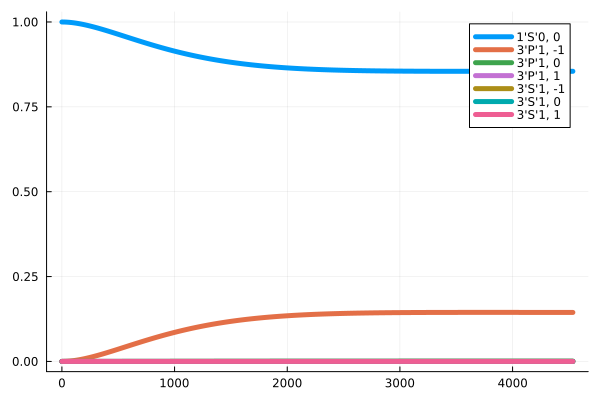

In [96]:
A = SubAtom(Sr88,[1,4,6])
b = NLevelBasis(A.basis.shape[1])

jumpMatrices, γs = Lindblads(A)
jumps = [SparseOperator(b,b,convert.(Float64,j)) for j in jumpMatrices] .* γs .*1;

C689 = Coupling(A,1,2,0.0005,(1,0,0),0)
C688 = Coupling(A,2,3,0.1,(0,1,0),0)
M = convert.(Float64,TRTree([C689,C688]))
HTR = SparseOperator(b,b,M)
ρ0 = DenseOperator(b,b,sparse([1],[1],[1.0 + 0.0im],b.shape[1],b.shape[1]))
tout, pops = timeevolution.master([0:1:30000;], ρ0, HTR, jumps);

p = plot()
for i in [1, AtomMultipletIndices(A,2)..., AtomMultipletIndices(A,3)...]
    plet,mIdx,m = AtomIndexMultiplet(A,i)
    plot!(p,tout, [real(p.data[i,i]) for p in pops], label = A.basis.multiplets[plet].name*", $(m)", linewidth=5, thickness_scaling = 1)
end
p

In [97]:
A.gammas

3×3 Matrix{Float64}:
 0.0  0.0469   0.0
 0.0  0.0     27.0
 0.0  0.0      0.0

In [94]:
SparseOperator(A.basis,A.basis,M)

Operator(dim=7x7)
  basis: AtomBasis([7], Multiplet[Multiplet([1], 0, Dict(:L => 0, :S => 0), 0.0, "1'S'0"), Multiplet([3], 1, Dict(:L => 1, :S => 1), 0.701623513053792, "3'P'1"), Multiplet([3], 1, Dict(:L => 0, :S => 1), 2.803247026107584, "3'S'1")])sparse([2, 1, 5, 7, 2, 4], [1, 2, 2, 4, 5, 7], [0.0005, 0.0005, -0.07071067811865477, 0.07071067811865477, -0.07071067811865477, 0.07071067811865477], 7, 7)

In [91]:
show(IOContext(stdout, :limit=>false), MIME"text/plain"(),M |> Matrix)

7×7 Matrix{Float64}:
 0.0      0.0005     0.0  0.0         0.0        0.0  0.0
 0.0005   0.0        0.0  0.0        -0.0707107  0.0  0.0
 0.0      0.0        0.0  0.0         0.0        0.0  0.0
 0.0      0.0        0.0  0.0         0.0        0.0  0.0707107
 0.0     -0.0707107  0.0  0.0         0.0        0.0  0.0
 0.0      0.0        0.0  0.0         0.0        0.0  0.0
 0.0      0.0        0.0  0.0707107   0.0        0.0  0.0

In [179]:
c = Coupling(Sr88,4,6,1,(1,0.5,0),1)
# I don't think the entry in the bottom right should be non-zero...
TICouplingMatrix(c)

16×16 SparseMatrixCSC{Float64, Int64} with 11 stored entries:
⎡⠀⠀⠀⠀⠀⠀⠀⠀⎤
⎢⠀⠀⠀⠀⠀⠀⠰⣀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎣⠀⠀⠐⢢⠀⠀⠐⢄⎦

In [9]:
sr88_1S0

Multiplet([1], 0, Dict(:L => 0, :S => 0), NaN, "1'S'0")